In [30]:
import os
import numpy as np
import rasterio as rio
import rasterio.plot
import rasterio.features
import rasterio.warp
import matplotlib.pyplot as plt
import earthpy as et
import earthpy.spatial as es
import earthpy.plot as ep
from matplotlib.colors import ListedColormap
%matplotlib inline

In [23]:
#with rio.open('fjarilsbacka.TIF') as dataset:
#    red, green, blue, nir = dataset.read()

# Image is multispectral with 4 bands. Red, Green, Blue, Near Infrared.
os.chdir('/home/jovyan/data')
dataset = rio.open('rgbn_sample.TIF')
bands = dataset.read()
red, green, blue, nir = bands

print(dataset.shape)
print(dataset.bounds)
print(dataset.crs)
print(dataset.count)
print(dataset.dtypes)
print(dataset.meta)

(1327, 1663)
BoundingBox(left=433990.0, bottom=6205180.0, right=450620.0, top=6218450.0)
EPSG:32633
4
('uint16', 'uint16', 'uint16', 'uint16')
{'driver': 'GTiff', 'dtype': 'uint16', 'nodata': 0.0, 'width': 1663, 'height': 1327, 'count': 4, 'crs': CRS.from_epsg(32633), 'transform': Affine(10.0, 0.0, 433990.0,
       0.0, -10.0, 6218450.0)}


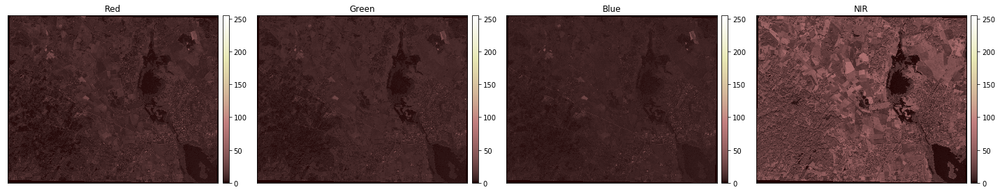

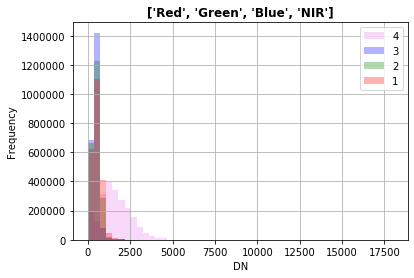

In [24]:
titles = ["Red", "Green", "Blue", "NIR"]
ep.plot_bands(bands, cols=4, title=titles, cmap="pink", figsize=(20, 20))
rio.plot.show_hist(bands, title=titles, bins=50, histtype='stepfilled', lw=0.0, stacked=False, alpha=0.3)
plt.show()

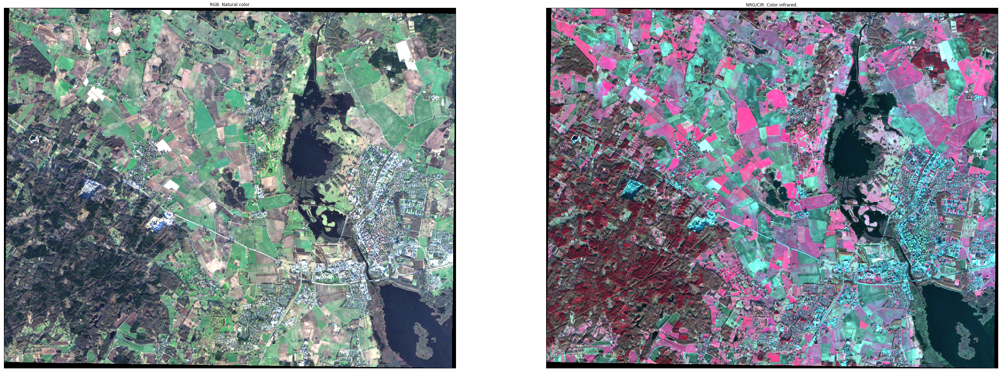

In [4]:
fig, (ax1, ax2) = plt.subplots(ncols=2, nrows=1, figsize=(50, 50), sharey=True)
ep.plot_rgb(
    bands,
    rgb=[0, 1, 2],
    ax=ax1,
    stretch=True,
    str_clip=2,
    title="RGB. Natural color",
)
ep.plot_rgb(
    bands,
    rgb=[3, 0, 1],
    ax=ax2,
    stretch=True,
    str_clip=2,
    title="NRG/CIR. Color infrared.",
)
plt.show()

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in true_divide
  import sys


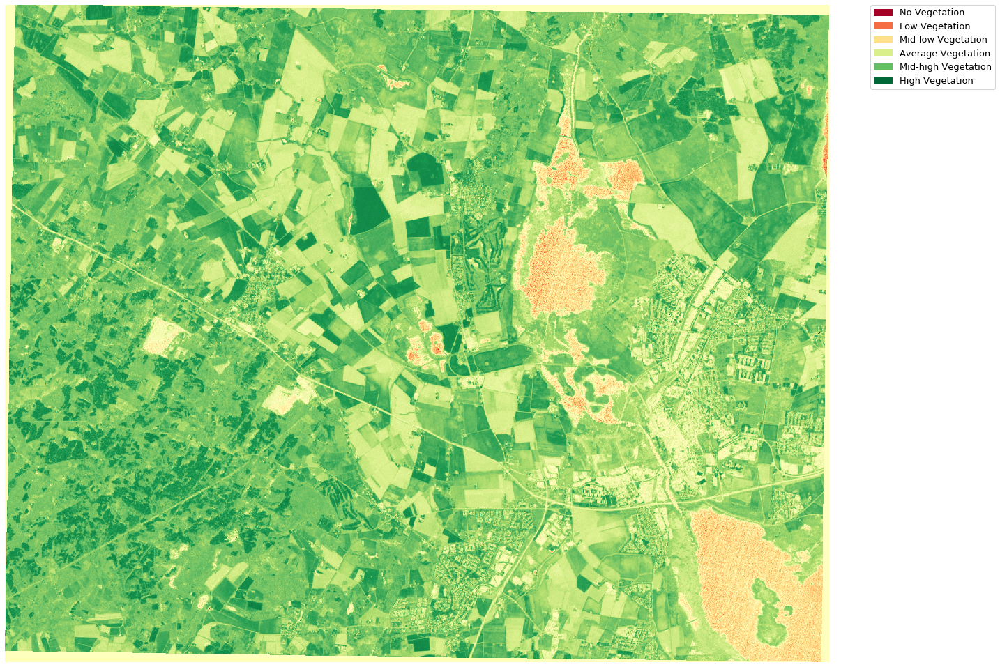

Min   : -0.9979838709677419
Max   : 0.9983566146261298
Mean  : 0.438526563675671
Median: 0.4893102057281162


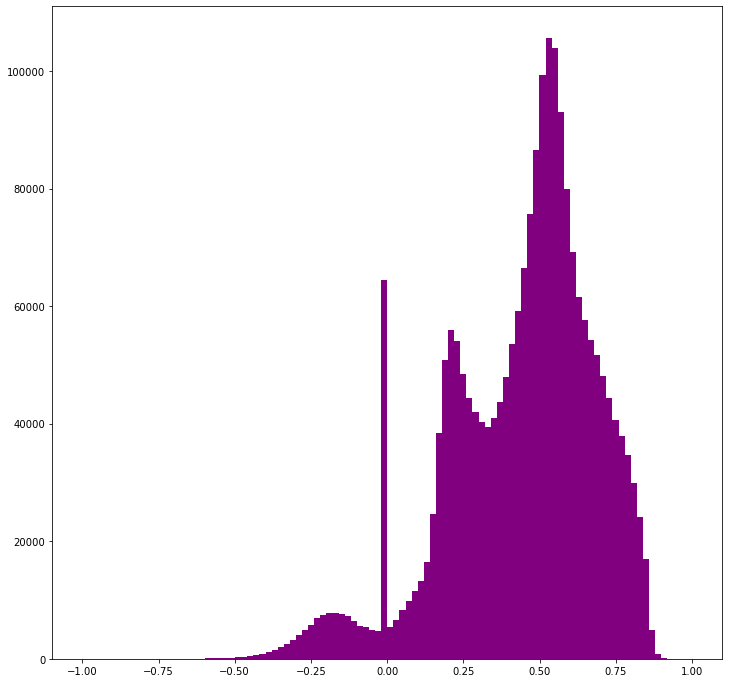

In [19]:
#https://www.hatarilabs.com/ih-en/ndvi-calculation-from-landsat8-images-with-python-3-and-rasterio-tutorial
#https://earthpy.readthedocs.io/en/latest/gallery_vignettes/plot_draw_legend_docs.html
#http://patrickgray.me/open-geo-tutorial/chapter_2_indices.html

red64 = red.astype('float64')
nir64 = nir.astype('float64')
ndvi=np.where((nir64+red64)==0., 0, (nir64-red64) / (nir64+red64))
#ndvi = (nir64-red64)/(nir64+red64)

f, ax = plt.subplots(figsize=(20, 20))
im = ax.imshow(ndvi, cmap="RdYlGn")
ep.draw_legend(
    im,
    titles=[
        "No Vegetation",
        "Low Vegetation",
        "Mid-low Vegetation",
        "Average Vegetation",
        "Mid-high Vegetation",
        "High Vegetation",
    ],
    classes=[-np.inf, 0.2, 0.28, 0.36, 0.44, 0.52]
)
plt.tight_layout()
ax.set_axis_off()
# Auto adjust subplot to fit figure size
plt.tight_layout()
plt.show()

ep.hist(ndvi, bins=100)
print('Min   : {m}'.format(m=ndvi.min()))
print('Max   : {m}'.format(m=ndvi.max()))
print('Mean  : {m}'.format(m=ndvi.mean()))
print('Median: {m}'.format(m=np.median(ndvi)))
plt.show()